<p align = "center" draggable=”false” ><img src="https://user-images.githubusercontent.com/37101144/161836199-fdb0219d-0361-4988-bf26-48b0fad160a3.png" 
     width="200px"
     height="auto"/>
</p>

# Hate Speech Detector

Today you are a machine learning engineer, a member of the Birdwatch at Twitter. 

The objective of this task is to detect hate speech in tweets. For the sake of simplicity, a tweet contains hate speech if it has a racist or sexist sentiment associated with it. In other words, we need to classify racist or sexist tweets from other tweets.

A labelled dataset of 31,962 tweets (late 2017 to early 2018) is provided in the form of a compressed csv file with each line storing a tweet id, its label, and the tweet. Label '1' denotes the tweet is racist/sexist while label '0' denotes the tweet is not racist/sexist.

We will first approach the problem in a traditional approach: clean the raw text using simple regex (regular expression), extract features, build a naive Bayes models to classify tweets; then we build a deep learning model and explain our deep learning model with LIME.

## 📚 Learning Objectives

By the end of this lesson, you will be able to:

- Understand the basic concepts in natural language processing (NLP)
- Perform basic NLP tasks on text, e.g., tweets
- Build a naive Bayes classifier to detect hate speech 
- Build a bidirectional long short-term memory (BiLSTM) to detect hate speech
- Visualize embeddings with Tensorboard embedding projector
- Explain models with LIME

# Task I: Data Preprocessing


1. Install dependencies.

    Most modules are pre-installed in Colab, however, we need to update `gensim` to its recent version and install `lime`.

In [1]:
!pip install -U -q gensim==4.2.0 lime

     |████████████████████████████████| 24.1 MB 1.2 MB/s 
     |████████████████████████████████| 275 kB 69.4 MB/s 


2. Connect Colab to your local Google Drive.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


3. Use `pandas.read_csv` to load the tweets in `tweets.csv.gz` and save the `pd.DataFrame` into `raw`. Make sure the path points to where the data is located in your Google Drive. 

In [3]:
# YOUR CODE HERE
import pandas as pd

In [4]:
raw = pd.read_csv("/content/drive/MyDrive/MLE9_W10/dat/tweets.csv.gz")

In [5]:
print(raw.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 749.2+ KB
None


4. Sample 5 random tweets from the dataset for each label and display `label` and `tweet` columns. 
Hint: one option is to use `sample()` followed by `groupby`. 

In [6]:
# Colab includes an extension that renders pandas dataframes into interactive displays that can be filtered, sorted, and explored dynamically.
from google.colab import data_table
data_table.enable_dataframe_formatter() 





In [7]:
# YOUR CODE HERE
raw.sample(5, axis=0)



,id,label,tweet
4237,4238,0,ðð¾ð ð½ simply doing me... #chaneesay...
7742,7743,0,"that's not diversity, you dipshits!"
5008,5009,0,@user really needs to train their aist better ...
4573,4574,0,my favorite place #zildjian #ludwig #drumming...
12030,12031,0,why can't noco just be killed off already? #an...


5. The tweets are in English and all words should be already in lowercase. 
Now calculate the number of characters in each tweet and assign the values to a new column `len_tweet` in `raw`. 

In [8]:
raw["len_tweet"] = raw["tweet"].apply(lambda x: len(x)) # YOUR CODE HERE




In [11]:
raw.sample(5)

,id,label,tweet,len_tweet
27319,27320,0,@user be happy ðâï¸anchored recoveryâ...,127
15554,15555,0,[v repo plus] madtownâs buffy makes lone app...,99
2539,2540,0,@user happy bihday to my brother man. needed ...,107
15185,15186,0,#visiting gorilla simulator: you need to do ...,109
2360,2361,0,"now playing : various - "" 03 impression"" on ...",61


6. What are the summary statistics of `len_tweet` for each label? 
Hint: use `groupby` and `describe`. 

In [9]:
pd.set_option("display.precision", 1)

raw.groupby("label")["len_tweet"].describe()


# YOUR CODE HERE

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,29720.0,84.3,29.6,11.0,62.0,88.0,107.0,274.0
1,2242.0,90.2,27.4,12.0,69.0,96.0,111.0,152.0


Note we have an imbalanced dataset: the ratio of non-hate speech to hate speech is roughly 13:1. 

7. Clean the tweets. 

    We use `re` to perform basic text manipulations. 
    Specically, remove anonymized user handle, remove numbers and special characters except hashtags.

In [10]:
import re

8. Remove user handles from the text in `tweet`, or anything directly following the symbols `@`, and save the resulting tweets to a new column `tidy_tweet` in `raw`. 
    
    Hint: you can use `re.sub` on individual text and [`apply`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html) a simple lambda function for the series `raw['tweet']`.

In [11]:
# setting up a 'sample' dataset for tersint functions
raw5 = raw.sample(10, random_state= 203)

In [12]:
# YOUR CODE HERE Task 1.8@[\w]* @[\w]*   [^a-zA-Z#] misses a space...



raw["tidy_tweet"] = raw["tweet"].apply(lambda x: re.sub(r"@[\w]*", "", x))

raw.sample(5, random_state=203)

,id,label,tweet,len_tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,109,and you keep telling that only aryans are all...
21928,21929,0,@user what makes you ?,25,what makes you ?
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...",101,"â #nzd/usd extends rbnz-led rally, hits fre..."
20436,20437,0,i'm on a mission to ride all of the animals! ...,91,i'm on a mission to ride all of the animals! ...
22552,22553,0,the color of a human skin matters a lot to the...,88,the color of a human skin matters a lot to the...


9. Remove non-alphabetic characters yet keep symbols `#` from `tidy_tweet` and save the result in `tidy_tweet`. 
In other words, keep all 26 letters and `#`.

    Note: in some applications, punctuations, emojis, or whether the word is in all caps can be of use. 
    You shall decide whether to extract such features for the application and perform error analysis to gain insight. 

In [13]:
# YOUR CODE HERE


raw["tidy_tweet"] = raw["tidy_tweet"].apply(lambda x: re.sub(r"[^a-zA-Z# ]", "", x))

raw.sample(5, random_state=203)

,id,label,tweet,len_tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,109,and you keep telling that only aryans are all...
21928,21929,0,@user what makes you ?,25,what makes you
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...",101,#nzdusd extends rbnzled rally hits fresh yea...
20436,20437,0,i'm on a mission to ride all of the animals! ...,91,im on a mission to ride all of the animals #...
22552,22553,0,the color of a human skin matters a lot to the...,88,the color of a human skin matters a lot to the...


10. Remove words that is shorter than 4 characters from the processed tweets.

    For example, 
      
    `i m on a mission to ride all of the animals #teamchanlv #vegas #lasvegas #funtimes`
      
    will be reduced to 
      
    `mission ride animals #teamchanlv #vegas #lasvegas #funtimes`


In [14]:



 # YOUR CODE HERE
raw["tidy_tweet"] = raw["tidy_tweet"].apply(lambda x:  " ".join([x  for x in x.split(" ") if len(x) > 3]))

raw.sample(5, random_state=203)

,id,label,tweet,len_tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,109,keep telling that only aryans allowed rape wom...
21928,21929,0,@user what makes you ?,25,what makes
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...",101,#nzdusd extends rbnzled rally hits fresh year ...
20436,20437,0,i'm on a mission to ride all of the animals! ...,91,mission ride animals #teamchanlv #vegas #lasve...
22552,22553,0,the color of a human skin matters a lot to the...,88,color human skin matters system when comes jud...


11. Remove stopwords and perform text normalization. 
    
    We will use `stopwords` collection and `SnowballStemmer` in `nltk` for this task. Before doing so, we need to tokenize the tweets. 
    Tokens are individual terms or words, and tokenization is simply to split a string of text into tokens. 
    You can use [`str.split()`](https://docs.python.org/3/library/stdtypes.html#str.split) on individual text and [`apply`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html) a simple lambda function for the series `raw['tidy_tweet']` and save the result into `tokenized_tweet`. 
    
    Check out some methods for the built-in type `str` [here](https://docs.python.org/3/library/stdtypes.html#string-methods).

In [15]:
tokenized_tweet = raw['tidy_tweet'].apply(lambda x : x.split())
tokenized_tweet.head()


0    [when, father, dysfunctional, selfish, drags, ...
1    [thanks, #lyft, credit, cant, cause, they, don...
2                              [bihday, your, majesty]
3                     [#model, love, take, with, time]
4                   [factsguide, society, #motivation]
Name: tidy_tweet, dtype: object

In [16]:
from pandas.core.common import random_state
tokenized_tweet.sample(5, random_state= 203)

790      [keep, telling, that, only, aryans, allowed, r...
21928                                        [what, makes]
25642    [#nzdusd, extends, rbnzled, rally, hits, fresh...
20436    [mission, ride, animals, #teamchanlv, #vegas, ...
22552    [color, human, skin, matters, system, when, co...
Name: tidy_tweet, dtype: object

12. Extract stop words and remove them from the tokens.

    Note: depending on the task / industry, it is highly recommended that one curate custom stop words. 

In [17]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [18]:



   # YOUR CODE HERE

tokenized_tweet = tokenized_tweet.apply(lambda x:  [x  for x in x if x not in stop_words])

In [19]:
assert any(word in tokenized_tweet for word in stop_words) == False

In [20]:
tokenized_tweet.head()

0    [father, dysfunctional, selfish, drags, kids, ...
1    [thanks, #lyft, credit, cant, cause, dont, off...
2                                    [bihday, majesty]
3                           [#model, love, take, time]
4                   [factsguide, society, #motivation]
Name: tidy_tweet, dtype: object

In [21]:
tokenized_tweet.sample(5, random_state= 203)

790      [keep, telling, aryans, allowed, rape, women, ...
21928                                              [makes]
25642    [#nzdusd, extends, rbnzled, rally, hits, fresh...
20436    [mission, ride, animals, #teamchanlv, #vegas, ...
22552    [color, human, skin, matters, system, comes, j...
Name: tidy_tweet, dtype: object

13. Create a new instance of a language specific [`SnowballStemmer`](https://www.nltk.org/api/nltk.stem.snowball.html), set the `language` to be "english"; see [how to](https://www.nltk.org/howto/stem.html). 

In [22]:
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")   # YOUR CODE HERE. splitting cell so that i do no run these lines over and over

In [23]:
tokenized_tweet = tokenized_tweet.apply(lambda x: [stemmer.stem(i) for i in x]) 
tokenized_tweet.head()

0    [father, dysfunct, selfish, drag, kid, dysfunc...
1    [thank, #lyft, credit, cant, caus, dont, offer...
2                                    [bihday, majesti]
3                           [#model, love, take, time]
4                         [factsguid, societi, #motiv]
Name: tidy_tweet, dtype: object

14. Lastly, let's stitch these tokens in `tokenized_tweet` back together and save them in `raw['tidy_tweet']`. 
Use [`str.join()`](https://docs.python.org/3/library/stdtypes.html#str.join) and `apply`.

In [24]:
raw['tidy_tweet'] =  tokenized_tweet.apply(lambda x:  " ".join(x) )        # YOUR CODE HERE

In [25]:
raw.head()

,id,label,tweet,len_tweet,tidy_tweet
0,1,0,@user when a father is dysfunctional and is s...,102,father dysfunct selfish drag kid dysfunct #run
1,2,0,@user @user thanks for #lyft credit i can't us...,122,thank #lyft credit cant caus dont offer wheelc...
2,3,0,bihday your majesty,21,bihday majesti
3,4,0,#model i love u take with u all the time in ...,86,#model love take time
4,5,0,factsguide: society now #motivation,39,factsguid societi #motiv


# Task 2. Wordcloud and Hashtag

In this task, we want to gain a general idea of what the common words were and how hashtags were used in tweets. 
We will create wordclouds and extract the top hashtags used in each label. 

1. Before doing so, out of caution of possible data leakage, split the `raw['tidy_tweet']` into training and test datasets in a stratified fashion, set the test size at .25 and random state as 42.
    
    Save the results into `X_train`, `X_test`, `y_train`, and `y_test`.

In [26]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    raw['tidy_tweet'], raw.label, 
    test_size=0.25, random_state=42, stratify=raw.label)

In [27]:
assert X_train.shape == y_train.shape == (23971, )
assert X_test.shape == y_test.shape == (7991,)

2. A word cloud is a cluster of words depicted in different sizes. 
The bigger the word appears, the more often it appears in the given text. 
It can offer an easy visual presentation to reveal the theme of a topic. 

    Function `plot_wordcloud` is provided to plot 50 most frequent words from the given text in the shape of twitter's logo. 
    You may need to replace the image path accordingly.

In [28]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def plot_wordcloud(text:str) -> None:
    '''
    Plot a wordcloud of top 50 words from the input text
    masked by twitter logo
    '''
    mask = np.array(Image.open("/content/drive/MyDrive/MLE9_W10/img/twitter-mask.png")) # REPLACE w/ YOUR FILE PATH
    wordcloud = WordCloud( 
        background_color='white', 
        random_state=42,
        max_words=50, 
        max_font_size=80, 
        mask = mask).generate(text)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

3. Visualize the wordcloud. 

    The function expects one long string. 
    Stitch all tidy tweets from training set and save the single string to `all_words`, then visualize the wordcloud for all the words.

In [29]:
all_words =  " ".join(x for x in X_train)    # YOUR CODE HERE



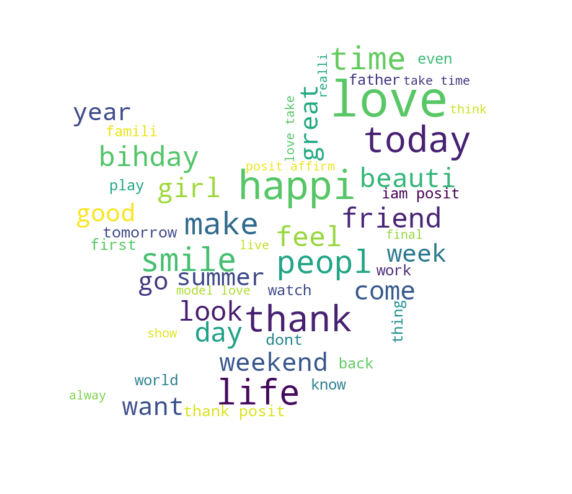

In [30]:
plot_wordcloud(all_words)

4. Visualize the wordcloud just for the text from the tweets identified as hate speech. 

    Similarly, you need to stitch all the tidy tweets in training set that were identified as hate speech. 
    Save the long string to `negative_words`.

In [31]:
y_train[4]==1

False

In [32]:
negative_words =  " ".join(x for x in X_train[y_train == 1]) # YOUR CODE HERE


In [33]:
negative_words[:500]

'fuck fuck bitch real simpleton figur pmet youth parliament #democraci listen free prop #jesus #black white promot #hate #biggotri need call vile scum fed provid inadequ #mentalhealth care #firstnat intern memo #thirdworldcanada #mmusimaiman toward white #zuma #malema combin #southafrica stand racism hate americad curs congress hater deplor #hate would best thing done #gop #con vote #nazi #fascist #dictat #trump scare littl bulli disgust #grandmoth #grandson #exist #alreadi trump #fascist #bigot '

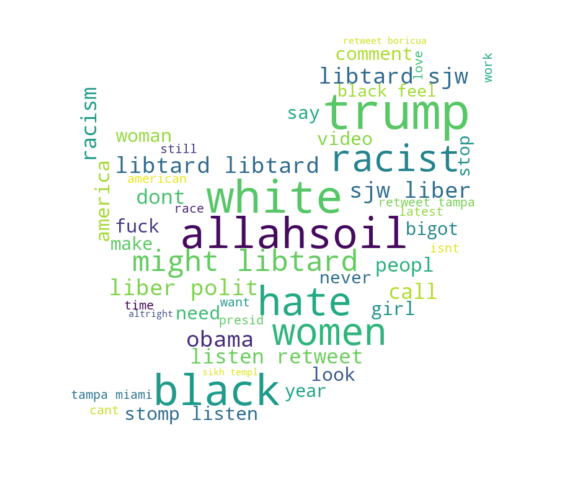

In [34]:
plot_wordcloud(negative_words)

5. Hashtag is a feature for tweets and we would like to inspect if hashtags provide information for our classification task. 

    Function `hashtag_extract` is provided to extract hastags from an iterable (list or series) and return the hashtags in a list. 

In [35]:
def hashtag_extract(x) -> list:
    """
    extract hastags from an iterable (list or series) and 
    return the hashtags in a list.
    """
    hashtags = []
    # Loop over the words in the tweet
    for i in x:
        ht = re.findall(r"#(\w+)", i)
        hashtags.append(ht)
    return hashtags

6. Extract hashtags from non-hate speech tweets.

In [36]:
HT_regular = hashtag_extract(X_train[y_train==0])   # YOUR CODE HERE

In [37]:
assert type(HT_regular) == list
assert type(HT_regular[0]) == list # nested list

7. Now extract hashtags from hate speech tweets.

In [38]:
HT_negative = hashtag_extract(X_train[y_train==1])  # YOUR CODE HERE

In [39]:
HT_negative[:10]

[[],
 ['democraci'],
 ['jesus', 'black', 'hate', 'biggotri'],
 ['mentalhealth', 'firstnat', 'thirdworldcanada'],
 ['mmusimaiman', 'zuma', 'malema', 'southafrica'],
 ['hate'],
 [],
 ['gop', 'con', 'nazi', 'fascist', 'dictat', 'trump'],
 ['grandmoth', 'grandson', 'exist', 'alreadi'],
 ['fascist', 'bigot', 'misogynist', 'sexualpred']]

8. Both `HT_regular` and `HT_negative` are nested lists, so use the following trick to unnest both lists.

In [40]:
HT_regular = sum(HT_regular,[])   #check to see how this works
HT_negative = sum(HT_negative,[])

In [41]:
assert type(HT_regular) == type(HT_negative) == list
assert type(HT_regular[0]) == type(HT_negative[0]) == str

9. Complete the function `top_hashtags` below to take a list of hashtags and return the top `n` hashtag keyword and its frequncy. 

In [42]:
from typing import List, Tuple
from collections import Counter
def top_hashtags(hashtags:List[str], n=10) -> List[Tuple[str, int]]:
    ''' Function to return the top n hashtags '''
    return Counter(hashtags).most_common(n)
    # YOUR CODE HERE

1. Apply the function to the hashtag lists from the non-hate speech tweets and the hate speech tweets.

In [43]:
top_hashtags(HT_regular)   # YOUR CODE HERE

[('love', 1234),
 ('posit', 693),
 ('smile', 513),
 ('healthi', 422),
 ('thank', 398),
 ('fun', 345),
 ('life', 327),
 ('affirm', 324),
 ('summer', 288),
 ('model', 284)]

In [44]:
top_hashtags(HT_negative)   # YOUR CODE HERE

[('trump', 97),
 ('allahsoil', 77),
 ('polit', 73),
 ('liber', 62),
 ('libtard', 57),
 ('sjw', 56),
 ('retweet', 50),
 ('miami', 37),
 ('black', 36),
 ('hate', 28)]

10. DISCUSS: are these hashtags making sense? should we include them as features or should we strip the # before tokenizing (that is, treat "#love" the same as "love")? why and why not?
          #YOUR ANSWER HERE: 

# Task 3. Features

Note that almost all the machine learning related Python modules expect numerical presentation of data; thus we need to transform our text first.
We will experiment with bag of words, tf-idf, and word2vec.  

1. Convert the collection of text documents to a matrix of token counts.

    Check the [official documentation](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html). 
    
    Create an instance of `CountVectorizer` named `bow_vectorizer`, set `max_features` to be `MAX_FEATURES`.
    Learn the vocabulary dictionary and return document-term matrix and save it to `bow_train`. Use `.fit_transform`. 

In [45]:
from sklearn.feature_extraction.text import CountVectorizer
MAX_FEATURES = 1000


bow_vectorizer =  CountVectorizer(max_features = MAX_FEATURES)  # YOUR CODE HERE
bow_train =  bow_vectorizer.fit_transform(X_train)  # YOUR CODE HERE

In [46]:
assert bow_train.shape == (X_train.shape[0], MAX_FEATURES)

2. Print the first three rows from `bow_train`. Hint: `.toarray()`.

In [47]:
print(bow_train.toarray()[:3])  # YOUR CODE HERE

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [48]:
from scipy.sparse.csr import csr_matrix
assert type(bow_train) == csr_matrix

3. Similarly, convert the collection of text documents to a matrix of TF-IDF features.
    
    Create an instance of [`TfidfVectorizer`](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html#sklearn.feature_extraction.text.TfidfVectorizer) named `tfidf_vectorizer`, set `max_features` to be `MAX_FEATURES`.

    Learn the vocabulary and idf, return document-term matrix and save it to `tfidf_train`. 

In [49]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [50]:
tfidf_vectorizer = TfidfVectorizer(max_features=MAX_FEATURES, stop_words='english')  # YOUR CODE HERE was already here!!
tfidf_train =  tfidf_vectorizer.fit_transform(X_train)

In [51]:
assert type(tfidf_train) == csr_matrix
assert tfidf_train.shape == bow_train.shape == (X_train.shape[0], MAX_FEATURES)

4. Extract word embeddings using Word2Vec. 
We will use [`gensim`](https://radimrehurek.com/gensim/auto_examples/tutorials/run_word2vec.html) for this task. 
    
    The Word2Vec model takes either a list of lists of tokens or an iterable that streams the sentences directly from disk/network. 
    Here, we tokenize the tidy tweets in `X_train` and save the list (`pd.series`) of lists of tokens to `tokenized_tweet`. 

In [52]:
#test this first
tokenized_tweet2 =  X_train.apply(lambda x : x.split())
assert tokenized_tweet2.shape == X_train.shape
tokenized_tweet2[:5]

1036     [like, spread, peanut, butter, white, bread, #...
2380     [watch, made, america, simpson, interest, went...
31605    [franci, underwood, seen, leav, marseill, #nojok]
23437    [#enjoy, #music, #today, #free, #app, #free, #...
2669     [#juic, experi, #notsobad, #healthyliv, #eatcl...
Name: tidy_tweet, dtype: object

In [53]:
tokenized_tweet =  X_train.apply(lambda x : x.split())  # YOUR CODE HERE

In [54]:
assert tokenized_tweet.shape == X_train.shape

In [55]:
tokenized_tweet.head()

1036     [like, spread, peanut, butter, white, bread, #...
2380     [watch, made, america, simpson, interest, went...
31605    [franci, underwood, seen, leav, marseill, #nojok]
23437    [#enjoy, #music, #today, #free, #app, #free, #...
2669     [#juic, experi, #notsobad, #healthyliv, #eatcl...
Name: tidy_tweet, dtype: object

5. Import `Word2Vec` from `gensim.models`; see [doc](https://radimrehurek.com/gensim/models/word2vec.html#gensim.models.word2vec.Word2Vec). 

    Create a skip-gram `Word2Vec` instance named `w2v` that learns on the `tokenized_tweet`, with `vector_size` set at `MAX_FEATURES`, and other parameters are provided. 

In [56]:
from gensim.models import Word2Vec

In [57]:
w2v = Word2Vec(       
        tokenized_tweet, # YOUR CODE HERE
        vector_size = MAX_FEATURES, # YOUR CODE HERE
        window=5, min_count=2, sg = 1, 
        hs = 0, negative = 10,  workers= 2, 
        seed = 34)

6. Train the skip-gram model, set the epochs at 20.

In [58]:
%%time
w2v.train(tokenized_tweet, total_examples= len(tokenized_tweet) , epochs = 20)    # YOUR CODE HERE

CPU times: user 1min 41s, sys: 193 ms, total: 1min 41s
Wall time: 56.1 s


(2751613, 3265900)

7. Let's see how the model performs. 
Specify a word and print out the 10 most similar words from the our tweets in the training set. 
Use [`most_similar`](https://radimrehurek.com/gensim/models/keyedvectors.html#gensim.models.keyedvectors.KeyedVectors.most_similar). 
Hint: print the type of `w2v` and `w2v.wv`.

In [59]:
print(w2v.wv.most_similar(positive = ["hate"] , topn = 10))   # YOUR CODE HERE

[('wat', 0.6026106476783752), ('muzzi', 0.5973221063613892), ('cowork', 0.589600145816803), ('chump', 0.5821219682693481), ('dislik', 0.581405520439148), ('crayon', 0.5812832713127136), ('conserv', 0.5773156881332397), ('cunt', 0.5673397779464722), ('andor', 0.5666807293891907), ('fuel', 0.5662888884544373)]


8. Discuss: how does w2v calculate the similarities? 

  YOUR ANSWER HERE

9. Discuss: do you think Word2Vec is supervised or unsupervised ML technique?

    YOUR ANSWER HERE

10. Engineer features. 

    For each tweet, we calculate the average of embeddings (function `word_vector`) and then apply it to every tidy tweet in `X_train` (use function `tokens_to_array`).
    Both functions are provided, inspect the code and save the features in `w2v_train`.

In [60]:
from gensim.models.keyedvectors import KeyedVectors

def word_vector(tokens:list, size:int, keyed_vec:KeyedVectors= w2v.wv):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += keyed_vec[word].reshape((1, size))
            count += 1
        except KeyError: 
            # handling the case where the token is not in vocabulary        
            continue
    if count != 0:
        vec /= count
    return vec

def tokens_to_array(tokens:list, size:int, keyed_vec:KeyedVectors= w2v.wv):
    array = np.zeros((len(tokens), size))
    for i in range(len(tokens)):
        array[i,:] = word_vector(tokens.iloc[i], size, keyed_vec=keyed_vec) 
    return array

In [61]:
tokenized_tweet.iloc[3], len(tokenized_tweet)

(['#enjoy', '#music', '#today', '#free', '#app', '#free', '#music'], 23971)

In [62]:
w2v_train =  tokens_to_array(tokenized_tweet, MAX_FEATURES, keyed_vec=w2v.wv)  # YOUR CODE HERE

In [63]:
assert w2v_train.shape == (X_train.shape[0], MAX_FEATURES)

11. Prepare the test data before modeling for each approach:


  - extract features from `X_test` using the bag of words approach; use `bow_vectorizer`
  - extract features from `X_test` using the tf-idf approach; use `tfidf_vectorizer`
  - extract features from `X_test` using Word2Vec embeddings; you need to first tokenized the tidy tweets in `X_test`, then convert the tokens to array of shape `(X_test.shape[0], MAX_FEATURES)`.

In [64]:
bow_test = bow_vectorizer.transform(X_test)    # YOUR CODE HERE. not fit_transform, only transform since it is already fitted (to train data) *
tfidf_test =  tfidf_vectorizer.transform(X_test) # YOUR CODE HERE

tokenized_tweet_test =  X_test.apply(lambda x : x.split())  # YOUR CODE HERE
w2v_test =  tokens_to_array(tokenized_tweet_test, MAX_FEATURES, keyed_vec=w2v.wv)  # YOUR CODE HERE

In [65]:
assert bow_test.shape == tfidf_test.shape == w2v_test.shape == (X_test.shape[0], MAX_FEATURES)

# Task 4. Naive Bayes classifiers

In this task, you will build a [naive Bayes](https://sebastianraschka.com/Articles/2014_naive_bayes_1.html) (here's another [ref](https://www.inf.ed.ac.uk/teaching/courses/inf2b/learnnotes/inf2b-learn07-notes-nup.pdf)), classifiers to identify the hate speech tweets using different sets of features from the last task, and evaluate their performances. 

In the era of deep learning, naive Bayes is useful due to its simplicity and reasonable performance, especially if there is not much training data available. A common interview question is "Why is naive Bayes naive?". 

We will use multi-variate Bernoulli naive Bayes [`BernoulliNB`](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.BernoulliNB.html); try other flavors of [naive Bayes](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.naive_bayes) if time permits. Code is pretty straightforward. 

1. Import `BernoulliNB` for modeling and `classification_report` for reporting performance. 

In [66]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report

2. Create an instance of  `BernoulliNB` named `BNBmodel`. 

    We can use it for all three feature sets.

In [67]:
BNBmodel = BernoulliNB()  # YOUR CODE HERE

3. Train the multi-variate Bernoulli naive Bayes using bag of words features and print the performance report.

In [68]:
 BNBmodel.fit(bow_train , y_train) # YOUR CODE HERE (train the model)

BernoulliNB()

In [69]:
 print(classification_report(y_test, BNBmodel.predict(bow_test) , target_names = ["not racist/sexist" , "racist/sexist"])) # YOUR CODE HERE (report). target_names = ["not racist/sexist" , "racist/sexist"]

                   precision    recall  f1-score   support

not racist/sexist       0.96      0.97      0.97      7430
    racist/sexist       0.56      0.46      0.50       561

         accuracy                           0.94      7991
        macro avg       0.76      0.72      0.73      7991
     weighted avg       0.93      0.94      0.93      7991



4. Similarly, train the model using tf-idf features and print the performance report. 

    Is the performance expected? Why or why not?

In [70]:
BNBmodel.fit(tfidf_train , y_train)  # YOUR CODE HERE

BernoulliNB()

In [71]:
print(classification_report(y_test, BNBmodel.predict(tfidf_test) , target_names = ["not racist/sexist" , "racist/sexist"]))  # YOUR CODE HERE

                   precision    recall  f1-score   support

not racist/sexist       0.96      0.97      0.97      7430
    racist/sexist       0.55      0.45      0.50       561

         accuracy                           0.94      7991
        macro avg       0.75      0.71      0.73      7991
     weighted avg       0.93      0.94      0.93      7991



5. Finally, train the model using Word2Vec embeddings and report the performance. 

In [72]:
BNBmodel.fit(w2v_train , y_train)  # YOUR CODE HERE
print(classification_report(y_test, BNBmodel.predict(w2v_test) , target_names = ["not racist/sexist" , "racist/sexist"]))  # YOUR CODE HERE

                   precision    recall  f1-score   support

not racist/sexist       0.98      0.84      0.91      7430
    racist/sexist       0.28      0.83      0.42       561

         accuracy                           0.84      7991
        macro avg       0.63      0.83      0.66      7991
     weighted avg       0.94      0.84      0.87      7991



6. Discuss the differences in performace using tf-idf vs skim-gram embeddings. 

    YOUR ANSWER HERE

7. Examine a few tweets where the model(s) failed. 
What other features would you include in the next iteration?

    YOUR ANSWER HERE

In [74]:
y_pred_tfidf = BNBmodel.predict(tfidf_test)
X_test[y_pred_tfidf != y_test]

22051      #anc quick #shit zill comment note black racist
29970                            kind expect #trump amrica
23135    #obamalegaci show negat stuff confus #obama #p...
15634    look like brother whos first wife found wanoth...
24901                  free porn thailand white girl black
                               ...                        
18315            might libtard #libtard #sjw #liber #polit
8913        serious consid perform inaugur #li #misogynist
7556     #blackpeopl beat #whiteperson isnt might make ...
4435     hell juan decid kellyann rais kid work weve ye...
16173    #blackonblack #ris #antiblack #dogwhistl #blac...
Name: tidy_tweet, Length: 561, dtype: object

In [81]:
X_test[:2], y_pred_tfidf[:2] , y_test[:2]

(15655    true life tough sometim feel helpless heabreak...
 21614     mate address argument rather #troll #staup #rude
 Name: tidy_tweet, dtype: object, array([0, 0]), 15655    0
 21614    0
 Name: label, dtype: int64)

# Task 5. Bidirectional LSTM 

In this task, you will build a bidirectional LSTM (BiLSTM) model to detect tweets identified as hate speech, and visualize the embedding layer using Tensorboard projector. 

Why BiLSTM? LSTM, at its core, preserves information from inputs that has already passed through it using the hidden state. Unidirectional LSTM only preserves information of the past because the only inputs it has seen are from the past. BiLSTMs run inputs in both ways, one from past to future and one from future to past and show very good results as they can understand context better [ref](https://stackoverflow.com/questions/43035827/whats-the-difference-between-a-bidirectional-lstm-and-an-lstm).

1. Tokenizing and padding. 
    
    As LSTM expects every sentence to be of the same length, in addition to [`Tokenizer`](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/text/Tokenizer) with a given number of vocabulary `VOCAB_SIZE`, we need to [pad](https://www.tensorflow.org/api_docs/python/tf/keras/utils/pad_sequences) shorter tweets with 0s until the length is `MAX_LEN` and truncate longer tweets to be exact `MAX_LEN` long. 
    
   Function `tokenize_pad_sequences` is provided except that you need to supply correct `num_words` and `filters`; do NOT filter `#`. 
   
   We feed the processed `tidy_tweet` to `tokenize_pad_sequences`, but one can perform the preprocessing steps in `Tokenizer` and apply it directly on the raw tweets.

In [82]:
VOCAB_SIZE = 25000  
MAX_LEN = 50

In [83]:
from keras.utils import pad_sequences

In [84]:
import tensorflow as tf
from tensorflow import keras

from keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences   #from keras.preprocessing.sequence import pad_sequences

def tokenize_pad_sequences(text):
    '''
    tokenize the input text into sequences of integers and then
    pad each sequence to the same length
    '''
    # Text tokenization
    tokenizer = Tokenizer(
        num_words= VOCAB_SIZE + 1, # YOUR CODE HERE
        filters= '!"$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n', # YOUR CODE HERE
        lower=True, split=' ', oov_token='oov')
    tokenizer.fit_on_texts(text)
    # Transforms text to a sequence of integers
    X = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    X = pad_sequences(X, padding='post', maxlen=MAX_LEN)

    return X, tokenizer

In [85]:
print('Before Tokenization & Padding \n', raw['tidy_tweet'][0])
X, tokenizer = tokenize_pad_sequences(raw['tidy_tweet'])
print('After Tokenization & Padding \n', X[0])
y = raw['label'].values

Before Tokenization & Padding 
 father dysfunct selfish drag kid dysfunct #run
After Tokenization & Padding 
 [  15 6461 2995 1683  218 6461  463    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]


In [86]:
# same but using the original tweets
print('Before Tokenization & Padding \n', raw['tweet'][0])
X_orig, tokenizer_orig = tokenize_pad_sequences(raw['tweet'])
print('After Tokenization & Padding \n', X[0])
y = raw['label'].values

Before Tokenization & Padding 
  @user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction.   #run
After Tokenization & Padding 
 [  15 6461 2995 1683  218 6461  463    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]


2. Let's split `X` into training and testing datasets, save 25% for testing. 
Then split training dataset into training and validation datasets, with 20% for validation. 
Set both `random_state` to be 42. 
Stratify both splits. 

In [87]:
X_train, X_test, y_train, y_test = train_test_split(
    X , y , test_size=0.25, random_state=42, stratify= y   # YOUR CODE HERE
    )
X_train, X_val, y_train, y_val = train_test_split(
    X_train , y_train , test_size=0.20, random_state=42, stratify= y_train   # YOUR CODE HERE 
    )

In [88]:
print('Train Set ->', X_train.shape, y_train.shape)
print('Validation Set ->', X_val.shape, y_val.shape)
print('Test Set ->', X_test.shape, y_test.shape)

Train Set -> (19176, 50) (19176,)
Validation Set -> (4795, 50) (4795,)
Test Set -> (7991, 50) (7991,)


3. Now build a sequential model:

    - an embedding layer
    - a bidirectional LSTM with 32 units and set `return_sequences=True` in LSTM
    - a global average pooling operation for temporal data
    - a dropout layer with 20% rate
    - a dense layer of 32 units and set the activation function to be ReLu
    - a dense layer of 1 unit and set the proper activation function for classification

In [101]:
from keras.models import Sequential
from tensorflow.keras import layers  # YOUR CODE HERE (layer imports)

EMBEDDING_DIM = 16   
model = Sequential([
    # YOUR CODE HERE
    layers.Embedding(VOCAB_SIZE + 1 , EMBEDDING_DIM , input_length= MAX_LEN),
    layers.Bidirectional(layers.LSTM(32, return_sequences=True)),
    layers.GlobalAveragePooling1D(),
    layers.Dropout(.2),
    layers.Dense(32, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

In [102]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 50, 16)            400016    
                                                                 
 bidirectional_1 (Bidirectio  (None, 50, 64)           12544     
 nal)                                                            
                                                                 
 global_average_pooling1d_1   (None, 64)               0         
 (GlobalAveragePooling1D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 1)                

4. Compile the model. 

    Fill in a proper loss function and use adam as the optimizer. 
    For metrics, include precision and recall in the metrics, in addition to accuracy. 

In [103]:
from keras.metrics import Precision, Recall
model.compile(
    loss= "binary_crossentropy", #YOUR CODE HERE
    optimizer='adam', 
    metrics= ["accuracy" , tf.keras.metrics.Precision() , tf.keras.metrics.Recall()] # YOUR CODE HERE]
    ) 

5. Train the model for 10 epochs on training dataset with a  validation set.

In [104]:
EPOCHS=10
BATCH_SIZE = 32
history = model.fit(X_train, y_train,
                    validation_data= [X_val , y_val], # YOUR CODE HERE
                    batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=2)

Epoch 1/10
600/600 - 11s - loss: 0.2159 - accuracy: 0.9379 - precision_1: 0.6541 - recall_1: 0.2446 - val_loss: 0.1313 - val_accuracy: 0.9562 - val_precision_1: 0.7423 - val_recall_1: 0.5744 - 11s/epoch - 18ms/step
Epoch 2/10
600/600 - 6s - loss: 0.0865 - accuracy: 0.9714 - precision_1: 0.8356 - recall_1: 0.7368 - val_loss: 0.1263 - val_accuracy: 0.9614 - val_precision_1: 0.8268 - val_recall_1: 0.5685 - 6s/epoch - 10ms/step
Epoch 3/10
600/600 - 6s - loss: 0.0490 - accuracy: 0.9850 - precision_1: 0.9246 - recall_1: 0.8565 - val_loss: 0.1544 - val_accuracy: 0.9593 - val_precision_1: 0.7925 - val_recall_1: 0.5685 - 6s/epoch - 10ms/step
Epoch 4/10
600/600 - 6s - loss: 0.0314 - accuracy: 0.9912 - precision_1: 0.9551 - recall_1: 0.9182 - val_loss: 0.1905 - val_accuracy: 0.9412 - val_precision_1: 0.5668 - val_recall_1: 0.6815 - 6s/epoch - 10ms/step
Epoch 5/10
600/600 - 6s - loss: 0.0245 - accuracy: 0.9929 - precision_1: 0.9590 - recall_1: 0.9383 - val_loss: 0.1764 - val_accuracy: 0.9597 - val

6. Function `plot_graphs` is provided below to visualize how the performance of model progresses as a function of epoch. 

    Visualize accuracy and loss. 

In [105]:
def plot_graphs(history, metric):
  fig, ax = plt.subplots()
  plt.plot(history.history[metric])
  plt.plot(history.history['val_'+metric], '')
  ax.set_xticks(range(EPOCHS))
  plt.xlabel("Epochs")
  plt.ylabel(metric)
  plt.legend([metric, 'val_'+metric])

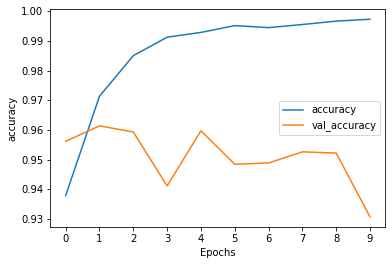

In [106]:
plot_graphs(history, "accuracy")  # YOUR CODE HERE

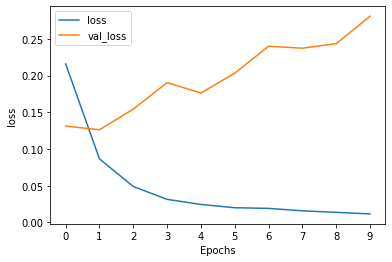

In [107]:
plot_graphs(history, "loss")  # YOUR CODE HERE

7. The model starts to overfit after a couple of epochs. 
Consider using [early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) to stop training when a monitored metric has stopped improving. 

  What can we do to tame overfitting?

    YOUR ANSWER HERE

In [97]:
#running model with early stopping
EPOCHS=10
BATCH_SIZE = 32
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3) #monitor val_loss
history_cbk = model.fit(X_train, y_train,
                    validation_data= [X_val , y_val],
                    batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=2 , callbacks=[callback])

Epoch 1/10
600/600 - 6s - loss: 0.0120 - accuracy: 0.9967 - precision: 0.9886 - recall: 0.9636 - val_loss: 0.2529 - val_accuracy: 0.9525 - val_precision: 0.6742 - val_recall: 0.6220 - 6s/epoch - 10ms/step
Epoch 2/10
600/600 - 6s - loss: 0.0110 - accuracy: 0.9972 - precision: 0.9872 - recall: 0.9725 - val_loss: 0.2075 - val_accuracy: 0.9522 - val_precision: 0.6851 - val_recall: 0.5893 - 6s/epoch - 10ms/step
Epoch 3/10
600/600 - 6s - loss: 0.0110 - accuracy: 0.9974 - precision: 0.9865 - recall: 0.9762 - val_loss: 0.2382 - val_accuracy: 0.9566 - val_precision: 0.7481 - val_recall: 0.5744 - 6s/epoch - 10ms/step
Epoch 4/10
600/600 - 6s - loss: 0.0070 - accuracy: 0.9984 - precision: 0.9947 - recall: 0.9822 - val_loss: 0.3272 - val_accuracy: 0.9537 - val_precision: 0.7036 - val_recall: 0.5863 - 6s/epoch - 10ms/step
Epoch 5/10
600/600 - 6s - loss: 0.0106 - accuracy: 0.9970 - precision: 0.9849 - recall: 0.9725 - val_loss: 0.2512 - val_accuracy: 0.9537 - val_precision: 0.6952 - val_recall: 0.604

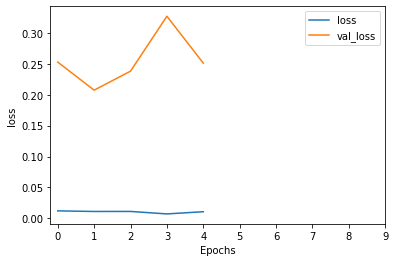

In [98]:
plot_graphs(history_cbk, "loss")

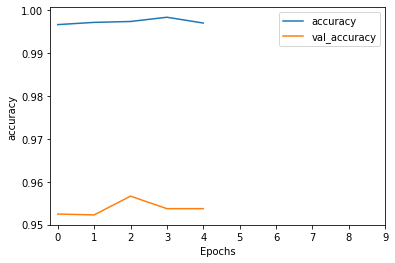

In [99]:
plot_graphs(history_cbk, "accuracy")

8. Print the classification report of the model on test dataset. 

In [112]:
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)


250/250 [==============================] - 1s 5ms/step


(7991,)

In [114]:
y_test.shape

(7991,)

In [115]:

print(classification_report(y_test, y_pred))  # YOUR CODE HERE

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      7430
           1       0.00      0.00      0.00       561

    accuracy                           0.93      7991
   macro avg       0.46      0.50      0.48      7991
weighted avg       0.86      0.93      0.90      7991



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9. Discuss: how does the BiLSTM model improve the classification over naive Bayes? 

    YOUR ANSWER HERE

In [ ]:
# # NB using tf-idf
#               precision    recall  f1-score   support

#            0       0.96      0.97      0.97      7430
#            1       0.55      0.48      0.51       561

#     accuracy                           0.94      7991
#    macro avg       0.75      0.72      0.74      7991
# weighted avg       0.93      0.94      0.93      7991

# # NB using word2vec
#               precision    recall  f1-score   support

#            0       0.98      0.85      0.91      7430
#            1       0.29      0.82      0.43       561

#     accuracy                           0.85      7991
#    macro avg       0.64      0.83      0.67      7991
# weighted avg       0.94      0.85      0.88      7991

10. Visualize embeddings using [Embedding Projector](https://www.tensorflow.org/tensorboard/tensorboard_projector_plugin) in Tensorboard. 
The setup for Tensorboard can be tricky, most of the code is provided. 

    TensorBoard reads tensors and metadata from the logs of your tensorflow projects. 
    The path to the log directory is specified with log_dir below. 
    
    In order to load the data into Tensorboard, we need to save a training checkpoint to that directory, along with metadata that allows for visualization of a specific layer of interest in the model.

    Load the TensorBoard notebook extension and import `projector` from `tensorboard.plugins`.

In [118]:
%load_ext tensorboard

In [119]:
from tensorboard.plugins import projector

11. Clear any logs from previous runs if any.

In [120]:
rm -rf /logs/  

12. Set up a logs directory, so Tensorboard knows where to look for data.

In [121]:
import os
log_dir='/logs/tweets-example/'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

13. Save the first `VOCAB_SIZE` most frequent words in the vocabulary as `metadata.tsv`.

In [122]:
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
  i = 0
  for label in tokenizer.word_index.keys():
    if label == 'oov':
      continue # skip oov
    f.write("{}\n".format(label))
    if i > VOCAB_SIZE:
      break
    i += 1

14. Save the weights we want to analyze as a variable. Note that the first value represents any unknown word, which is not in the metadata, here we will remove this value.

In [123]:
weights = tf.Variable(model.layers[0].get_weights()[0][1:]) # `embeddings` has a shape of (num_vocab, embedding_dim) 

In [124]:
weights

<tf.Variable 'Variable:0' shape=(25000, 16) dtype=float32, numpy=
array([[-0.00025184, -0.02263554,  0.04564336, ..., -0.07804708,
        -0.01343233, -0.01796108],
       [ 0.11713684, -0.11297414,  0.20319419, ..., -0.17689314,
        -0.14766711, -0.20016767],
       [-0.04607073,  0.0679183 ,  0.02912505, ...,  0.05429626,
         0.01779254, -0.0735855 ],
       ...,
       [ 0.06166192, -0.10768035,  0.0270072 , ..., -0.08048487,
        -0.09053362, -0.06588514],
       [ 0.00907413,  0.02540639, -0.03559456, ...,  0.01761035,
        -0.02041873, -0.04972057],
       [ 0.03389191,  0.0252091 , -0.01959059, ...,  0.04792644,
         0.01162468,  0.01987689]], dtype=float32)>

15. Create a checkpoint from embedding, the filename and key are the name of the tensor.

In [125]:
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

'/logs/tweets-example/embedding.ckpt-1'

16. Set up config.

In [126]:
config = projector.ProjectorConfig()
embedding = config.embeddings.add()

17. The name of the tensor will be suffixed by `/.ATTRIBUTES/VARIABLE_VALUE`.

In [127]:
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)

18. Verify the following files exist under the current directory

In [128]:
ls /logs/tweets-example/

checkpoint                            metadata.tsv
embedding.ckpt-1.data-00000-of-00001  projector_config.pbtxt
embedding.ckpt-1.index


19. Now run Tensorboard against on log data we just saved. 

    You may need to run this cell **twice** to see the projector correctly. 
    Use Chrome for least friction.

In [130]:
%tensorboard --logdir /logs/tweets-example/

Reusing TensorBoard on port 6006 (pid 1285), started 0:00:15 ago. (Use '!kill 1285' to kill it.)

<IPython.core.display.Javascript object>

The TensorBoard Projector can be a great tool for interpreting and visualzing embedding. The dashboard allows users to search for specific terms, and highlights words that are adjacent to each other in the embedding (low-dimensional) space. Try a few word in the Search box and see if the embeddings make sense. 

# Task 6. Interpretation

Lastly let's try to understnad predictions by BiLSTM using a model agnostic approach -- [Local interpretable model-agnostic explanations (LIME)](https://christophm.github.io/interpretable-ml-book/lime.html)

1. Import `LimeTextExplainer` from the [`lime_text`](https://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_text) module in package [`lime`](https://github.com/marcotcr/lime)

In [131]:
from lime.lime_text import LimeTextExplainer

2. Create an instance of `LimeTextExplainer`, call it `explanier`. 

In [132]:
explainer = LimeTextExplainer(class_names=['no', 'yes'], random_state=2)

3. Method `explain_instance` expects the `classifier_fn` to be a function, we provide the function `predict_proba` as below. 

In [133]:
def predict_proba(arr):
    processed = tokenizer.texts_to_sequences(arr)
    processed = pad_sequences(processed, padding='post', maxlen=MAX_LEN)
    pred = model.predict(processed)
    r = []
    for i in pred:
        temp = i[0]
        r.append(np.array([1-temp,temp])) 
    return np.array(r)

4. Read about [`explain_instance`](https://lime-ml.readthedocs.io/en/latest/lime.html#lime.lime_text.LimeTextExplainer.explain_instance). 

    Create an instance named `exp` to explain the 16399th tidy tweet from the original dataset, i.e., `raw.tidy_tweet.iloc[16399]`. 

In [134]:
idx = 16399 
exp = explainer.explain_instance(
    raw.tidy_tweet.iloc[idx], 
    classifier_fn = predict_proba, # YOUR CODE HERE
    num_features=6)
exp.show_in_notebook(text=raw.tidy_tweet.iloc[idx])

157/157 [==============================] - 1s 4ms/step


5. Pick another random tweet and generate explanations for the prediction.

In [137]:
idx = 15749 
exp = explainer.explain_instance(
    raw.tidy_tweet.iloc[idx], 
    classifier_fn = predict_proba, # YOUR CODE HERE
    num_features=6)
exp.show_in_notebook(text=raw.tidy_tweet.iloc[idx])

157/157 [==============================] - 1s 4ms/step


6. Jot down your observations in explaining the model. 

    YOUR ANSWER HERE

# Acknowledgement & Reference

- Data is adapted from [Twitter sentiment analysis](https://datahack.analyticsvidhya.com/contest/practice-problem-twitter-sentiment-analysis/#ProblemStatement)
- [Twitter sentiment analysis](https://github.com/prateekjoshi565/twitter_sentiment_analysis/blob/master/code_sentiment_analysis.ipynb) 
- [Introduction to Word Embedding and Word2Vec](https://towardsdatascience.com/introduction-to-word-embedding-and-word2vec-652d0c2060fa)
- [When to use GRU over LSTM?](https://datascience.stackexchange.com/questions/14581/when-to-use-gru-over-lstm)
- Use a trained Word2Vec, Doc2Vec or FastTest embedding by `gensim` in buiding an embedding layers in Tensorflow, here's [how-to](https://github.com/RaRe-Technologies/gensim/wiki/Using-Gensim-Embeddings-with-Keras-and-Tensorflow).